In [1]:
from PIL import Image
from modules.facedet import FaceDet
from modules.select import Select
from modules.emoji import Emoji
from modules.result import Result

/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/torch/cuda/__init__.py:141: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11070). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at /opt/conda/conda-bld/pytorch_1708025845868/work/c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0


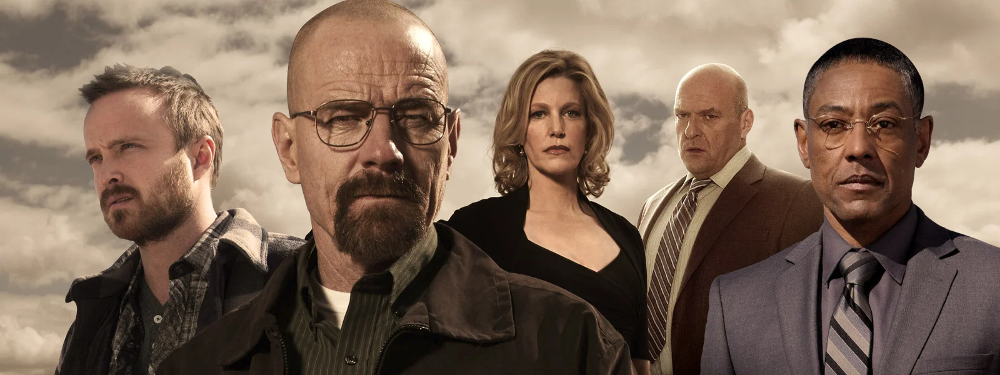

In [2]:
image = Image.open('assets/BreakingBad.webp').convert('RGB')
image

In [3]:
step = 'OBJ0=FACEDET(image=IMAGE)'

In [4]:
facedet = FaceDet(device='cpu')

/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [5]:
state = {
    'IMAGE': image
}

In [6]:
output, html = facedet.execute(step, state)

In [7]:
output

((475.64813, 35.91154, 716.47894, 404.3423),
 (835.04285, 118.677986, 938.9472, 275.33417),
 (1078.0487, 120.11847, 1181.3081, 273.6041),
 (1291.5869, 109.50722, 1464.3923, 350.10693),
 (135.36148, 155.35739, 302.18185, 374.67935))

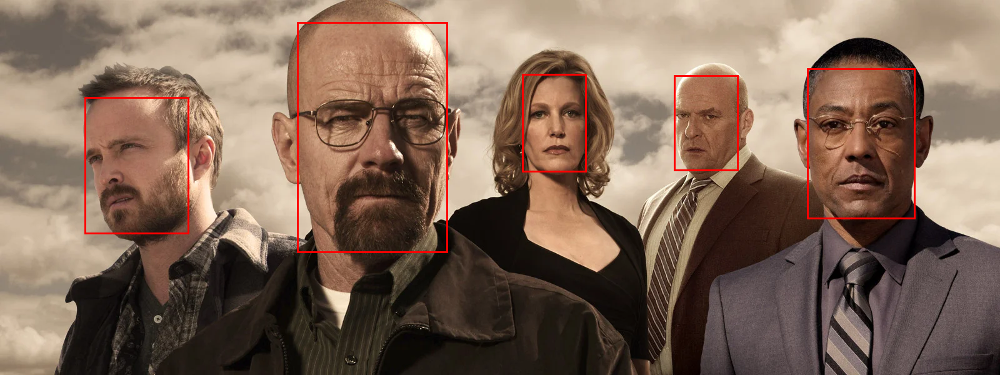

In [8]:
html['image_with_bbox']

In [9]:
state.keys()

dict_keys(['IMAGE', 'OBJ0'])

In [10]:
step2 = "OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Walter White',category=None)"

In [11]:
select = Select({}, {})

In [12]:
output, html = select.execute(step2, state)

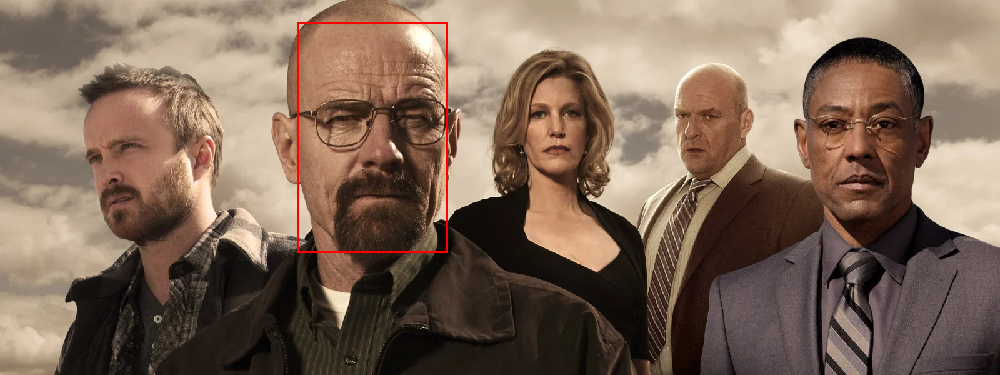

In [13]:
html['output']

In [14]:
step3 = "IMAGE0=EMOJI(image=IMAGE,object=OBJ1,emoji='face_with_tongue')"
step3

"IMAGE0=EMOJI(image=IMAGE,object=OBJ1,emoji='face_with_tongue')"

In [15]:
emoji = Emoji()

In [16]:
state.keys()

dict_keys(['IMAGE', 'OBJ0', 'OBJ1'])

In [17]:
output, html = emoji.execute(step3, state)

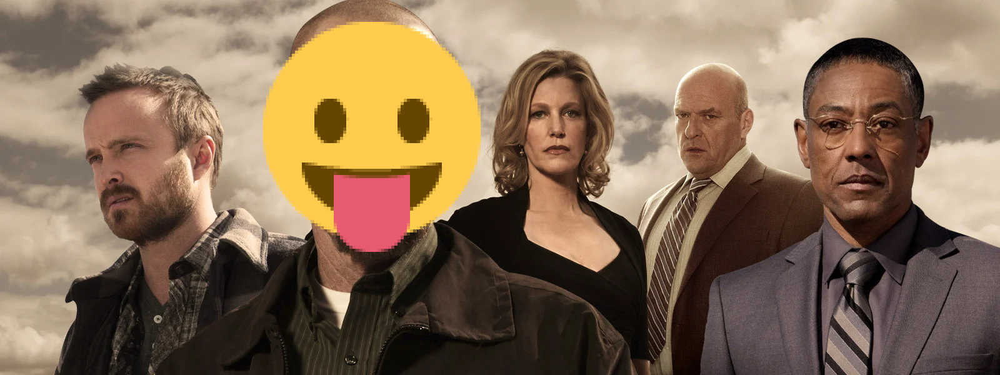

In [18]:
output

In [19]:
step4 = "OBJ2=SELECT(image=IMAGE,object=OBJ0,query='Skyler White',category=None)"

In [20]:
output, html = select.execute(step4, state)

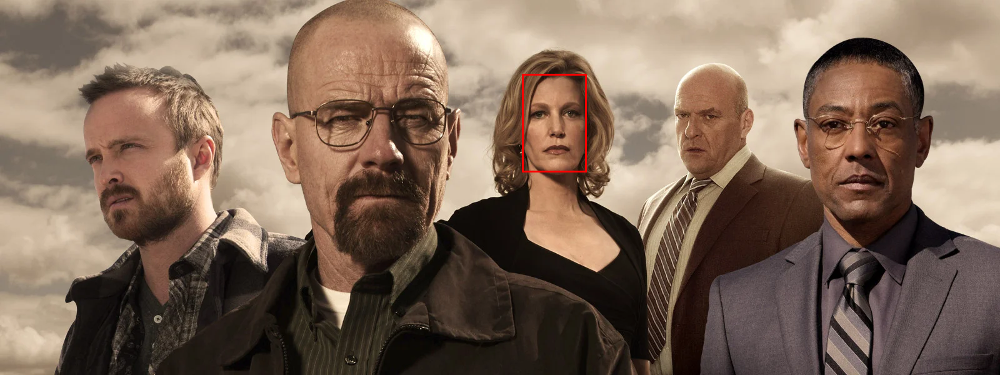

In [21]:
html['output']

In [22]:
step5 = "IMAGE1=EMOJI(image=IMAGE0,object=OBJ2,emoji='winking_face')"

In [23]:
output, html = emoji.execute(step5, state)

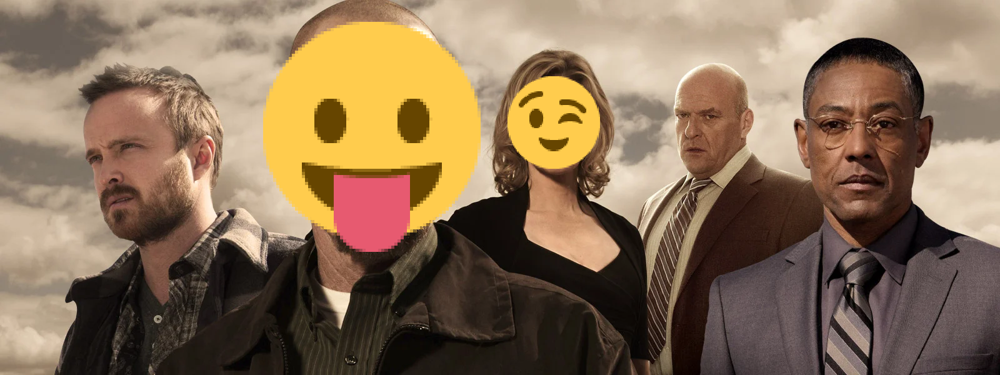

In [24]:
output

In [25]:
step6 = "OBJ3=SELECT(image=IMAGE,object=OBJ0,query='Hispanic man',category=None)"   # it didn't understand Gus Fring!

In [26]:
output, html = select.execute(step6, state)

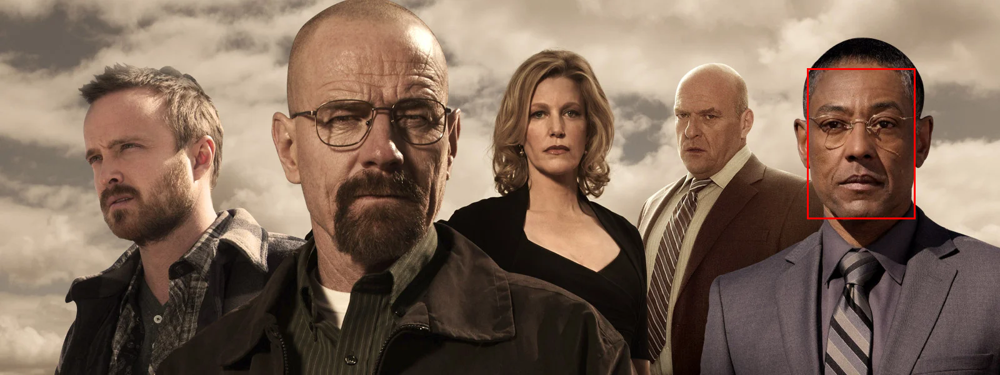

In [27]:
html['output']

In [28]:
step7 = "IMAGE2=EMOJI(image=IMAGE1,object=OBJ3,emoji='smiling_face_with_sunglasses')"

In [29]:
output, html = emoji.execute(step7, state)

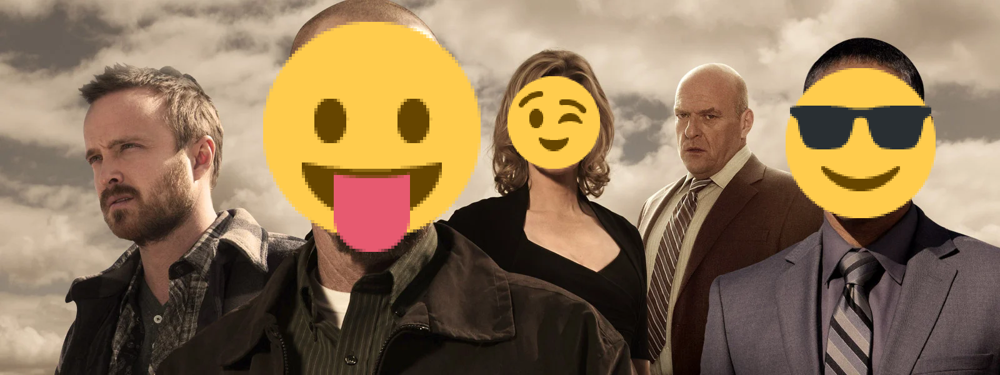

In [30]:
output

In [31]:
step8 = "OBJ4=SELECT(image=IMAGE,object=OBJ0,query='Bald man',category=None)"   # it didn't understand hank schrader!

In [32]:
output, html = select.execute(step8, state)

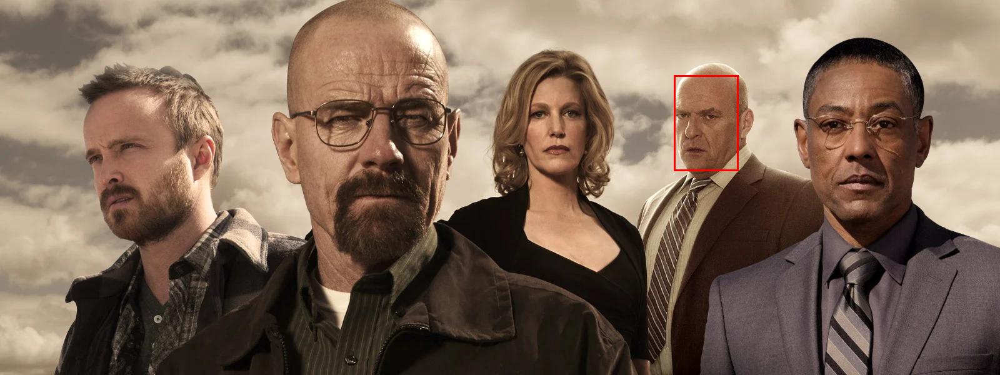

In [33]:
html['output']

In [34]:
step9 = "IMAGE3=EMOJI(image=IMAGE2,object=OBJ4,emoji='crying_face')"

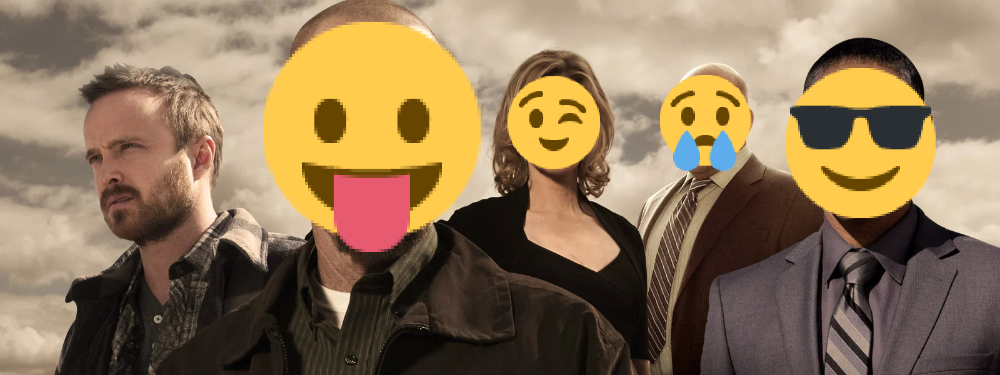

In [35]:
output, html = emoji.execute(step9, state)
output

In [36]:
step10 = "OBJ5=SELECT(image=IMAGE3,object=OBJ0,query='Jessy Pinkman',category=None)"

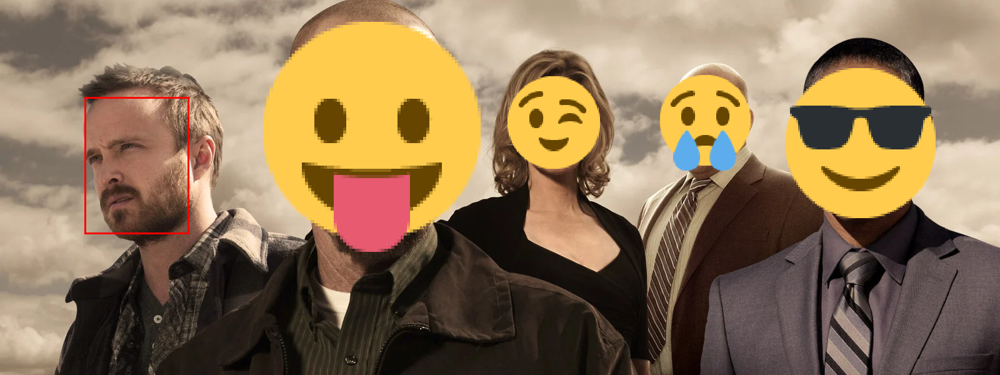

In [37]:
output, html = select.execute(step10, state)
html['output']

In [38]:
step11 = "IMAGE4=EMOJI(image=IMAGE3,object=OBJ5,emoji='smiling_face')"

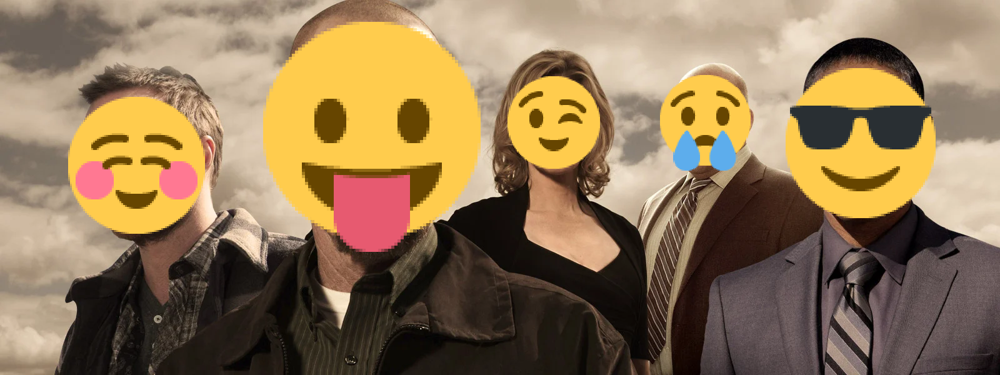

In [39]:
output, html = emoji.execute(step11, state)
output